In [1]:
import torch
from torchvision.io import read_image
from torchvision import transforms

In [2]:
from PIL import Image                                 
import torchvision.transforms.functional as TF       
import numpy as np

In [3]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)

Using device: cuda


##Checking data

In [4]:
import matplotlib.pyplot as plt

In [5]:
import os
from os import listdir

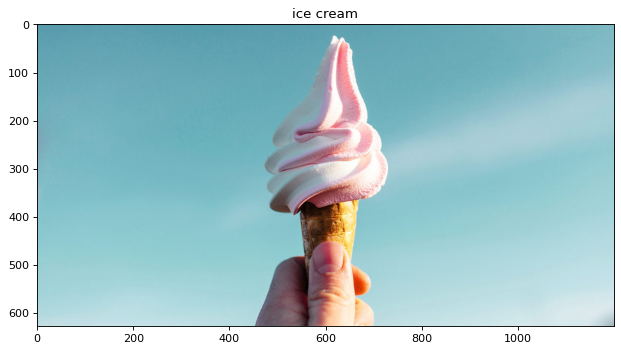

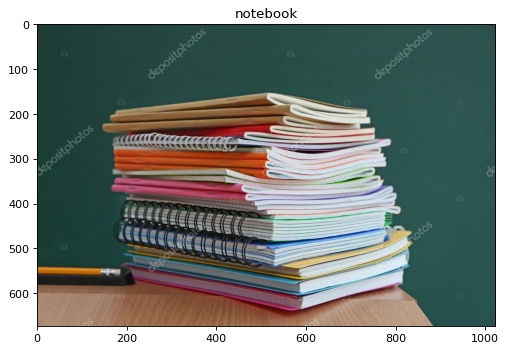

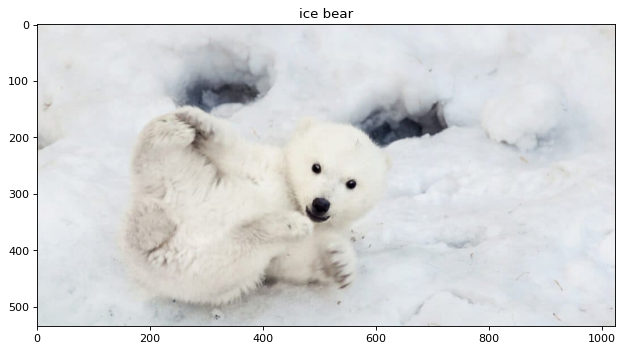

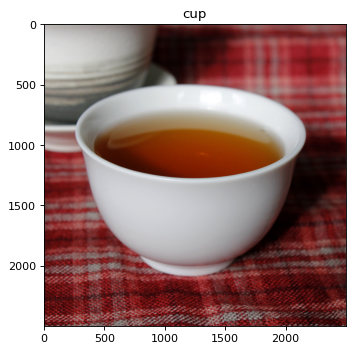

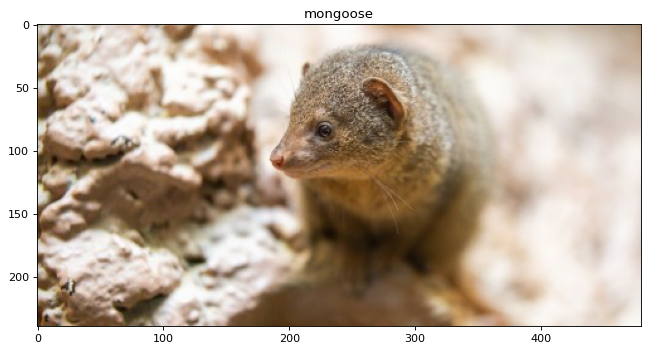

...

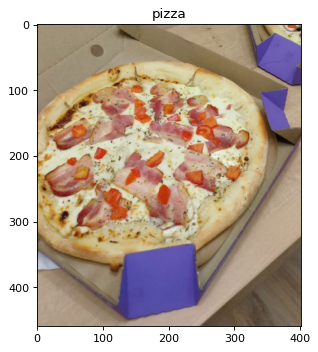

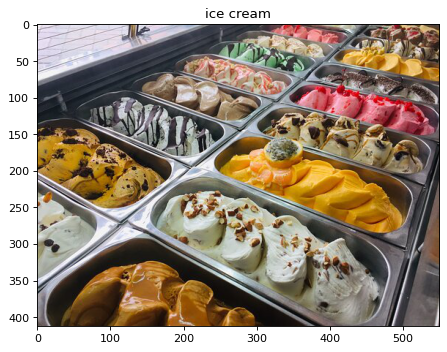

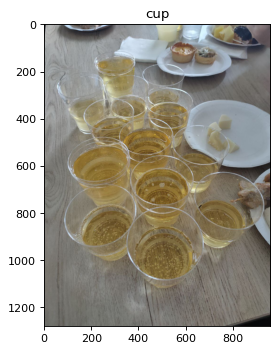

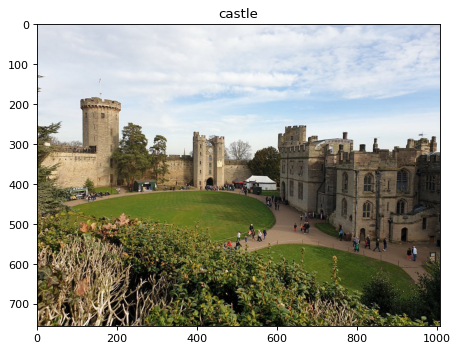

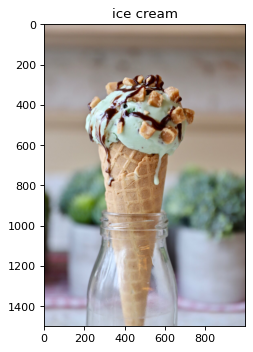

In [ ]:
folder_dir = "images"
for image in os.listdir(folder_dir):
      if (image.endswith(".jpg")):
        img = plt.imread(folder_dir+'/'+image)
        plt.figure(figsize=(10,5),dpi=80)
        plt.title(image[image.find('_')+1:image.find('.')])
        plt.imshow(img)
        plt.show()

##ResNet50

In [6]:
from torchvision.models import resnet50, ResNet50_Weights

In [7]:
weights = ResNet50_Weights.IMAGENET1K_V1
model = resnet50(weights=weights)
model.eval()
preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

In [8]:
def evaluate_on_my_data_resnet(img):
  image = preprocess(img).unsqueeze(0)  

  if torch.cuda.is_available():
    image = image.to('cuda')
    model.to('cuda')
        
  prediction = model(image).squeeze(0).softmax(0)
  n = 5
  class_id = torch.topk(prediction.flatten(), n).indices
  cat_names = []
  for i in range(n):
    score = prediction[class_id[i]].item()
    category_name = weights.meta["categories"][class_id[i]]
    # print(f"{category_name}: {100 * score:.1f}%")
    cat_names.append(category_name)
  return cat_names

In [9]:
def get_acc():
  folder_dir = "images"
  top_5_acc_num = 0 
  top_1_acc_num = 0 
  num_of_pics = 0
  for image in os.listdir(folder_dir):
      num_of_pics = num_of_pics + 1
      if (image.endswith(".jpg")):
          img = Image.open(folder_dir+'/'+image)
          list_of_top_5_preds = evaluate_on_my_data_resnet(img)
          # print(image)
          # print(list_of_top_5_preds)
          real_name = (image[image.find('_')+1:image.find('.')])
          if real_name in list_of_top_5_preds:
            top_5_acc_num = top_5_acc_num + 1
          if real_name==list_of_top_5_preds[0]:
            top_1_acc_num = top_1_acc_num + 1
  return top_5_acc_num/num_of_pics , top_1_acc_num/num_of_pics

In [19]:
%%time
t_5_acc, t_1_acc = get_acc()
print(f'Top 5 accuracy:{np.round(t_5_acc,3)}, Top 1 accuracy:{np.round(t_1_acc,3)}')

Top 5 accuracy:0.837, Top 1 accuracy:0.51
CPU times: user 2.63 s, sys: 61.5 ms, total: 2.69 s
Wall time: 2.71 s


In [20]:
if device.type == 'cuda':
    print(torch.cuda.get_device_name(0))
    print('Memory Usage:')
    print('Allocated:', round(torch.cuda.memory_allocated(0)/1024**3,1), 'GB')
    print('Cached:   ', round(torch.cuda.memory_cached(0)/1024**3,1), 'GB')

Tesla T4
Memory Usage:
Allocated: 0.1 GB
Cached:    0.2 GB


In [21]:
print(round(torch.cuda.max_memory_allocated()/1024**3,1), 'GB')

0.2 GB


##VGG19

In [8]:
from torchvision.models import vgg19
from torchvision.models.vgg import VGG19_Weights

In [9]:
weights_vgg19 = VGG19_Weights.IMAGENET1K_V1
model = vgg19(weights=weights_vgg19)

In [10]:
def evaluate_on_my_data_vgg19(image): 
  image = preprocess(image)          
  img = image.unsqueeze(0)   
  if torch.cuda.is_available():
    img = img.to('cuda')
    model.to('cuda')
  prediction = model(img).squeeze(0).softmax(0)
  n = 5
  cat_names = []
  class_id = torch.topk(prediction.flatten(), n).indices
  for i in range(n):
    score = prediction[class_id[i]].item()
    category_name = weights.meta["categories"][class_id[i]]
    # print(f"{category_name}: {100 * score:.1f}%")
    cat_names.append(category_name)
  return cat_names

In [11]:
def get_acc():
  folder_dir = "images"
  top_5_acc_num = 0 
  top_1_acc_num = 0 
  num_of_pics = 0
  for image in os.listdir(folder_dir):
      num_of_pics = num_of_pics + 1
      if (image.endswith(".jpg")):
          img = Image.open(folder_dir+'/'+image)
          list_of_top_5_preds = evaluate_on_my_data_vgg19(img)
          # print(image[image.find('_')+1:image.find('.')])
          # print(list_of_top_5_preds)
          real_name = (image[image.find('_')+1:image.find('.')])
          if real_name in list_of_top_5_preds:
            top_5_acc_num = top_5_acc_num + 1
          if real_name==list_of_top_5_preds[0]:
            top_1_acc_num = top_1_acc_num + 1
  return top_5_acc_num/num_of_pics , top_1_acc_num/num_of_pics

In [15]:
%%time
t_5_acc, t_1_acc = get_acc()
print(f'Top 5 accuracy:{np.round(t_5_acc,3)}, Top 1 accuracy:{np.round(t_1_acc,3)}')

Top 5 accuracy:0.878, Top 1 accuracy:0.551
CPU times: user 2.67 s, sys: 38.7 ms, total: 2.71 s
Wall time: 2.71 s


In [16]:
if device.type == 'cuda':
    print(torch.cuda.get_device_name(0))
    print('Memory Usage:')
    print('Allocated:', round(torch.cuda.memory_allocated(0)/1024**3,1), 'GB')
    print('Cached:   ', round(torch.cuda.memory_cached(0)/1024**3,1), 'GB')

Tesla T4
Memory Usage:
Allocated: 0.5 GB
Cached:    0.7 GB


In [17]:
print(round(torch.cuda.max_memory_allocated()/1024**3,1), 'GB')

0.6 GB


##AlexNet

In [20]:
from torchvision.models import alexnet, AlexNet_Weights

In [21]:
weights_alexnet = AlexNet_Weights.IMAGENET1K_V1
model = alexnet(weights_alexnet)

In [22]:
def evaluate_on_my_data_alexnet(image): 
  image = preprocess(image)         
  img = image.unsqueeze(0) 
  if torch.cuda.is_available():
    img = img.to('cuda')
    model.to('cuda')
  prediction = model(img).squeeze(0).softmax(0)
  n = 5
  cat_names = []
  class_id = torch.topk(prediction.flatten(), n).indices
  for i in range(n):
    score = prediction[class_id[i]].item()
    category_name = weights.meta["categories"][class_id[i]]
    # print(f"{category_name}: {100 * score:.1f}%")
    cat_names.append(category_name)
  return cat_names

In [23]:
def get_acc():
  folder_dir = "images"
  top_5_acc_num = 0 
  top_1_acc_num = 0 
  num_of_pics = 0
  for image in os.listdir(folder_dir):
      num_of_pics = num_of_pics + 1
      if (image.endswith(".jpg")):
          img = Image.open(folder_dir+'/'+image)
          list_of_top_5_preds = evaluate_on_my_data_alexnet(img)
          # print(image[image.find('_')+1:image.find('.')])
          # print(list_of_top_5_preds)
          real_name = (image[image.find('_')+1:image.find('.')])
          if real_name in list_of_top_5_preds:
            top_5_acc_num = top_5_acc_num + 1
          if real_name==list_of_top_5_preds[0]:
            top_1_acc_num = top_1_acc_num + 1
  return top_5_acc_num/num_of_pics , top_1_acc_num/num_of_pics

In [24]:
%%time
t_5_acc, t_1_acc = get_acc()
print(f'Top 5 accuracy:{np.round(t_5_acc,3)}, Top 1 accuracy:{np.round(t_1_acc,3)}')

Top 5 accuracy:0.796, Top 1 accuracy:0.49
CPU times: user 2.17 s, sys: 327 ms, total: 2.5 s
Wall time: 2.49 s


In [18]:
if device.type == 'cuda':
    print(torch.cuda.get_device_name(0))
    print('Memory Usage:')
    print('Allocated:', round(torch.cuda.memory_allocated(0)/1024**3,1), 'GB')
    print('Cached:   ', round(torch.cuda.memory_cached(0)/1024**3,1), 'GB')

Tesla T4
Memory Usage:
Allocated: 0.1 GB
Cached:    0.2 GB


In [25]:
print(round(torch.cuda.max_memory_allocated()/1024**3,1), 'GB')

0.2 GB


Сравнение по точности, времени выполнения, памяти:

|         |Top 5 accuracy | Top 1 accuracy | time | GPU usage |
:---------|---------------|----------------|------|-----------|
|ResNet50 |   0.837       |0.51           | 2.66 s|    0.2 GB|
VGG19     |0.878 | 0.551 | 2.71 s | 0.6 GB |
AlexNet   | 0.796| 0.49 | 2.49 s |  0.2 GB |